In [3]:
import cv2
import matplotlib.pyplot as plt
import math
import numpy as np
from skimage import metrics
from dahuffman import HuffmanCodec

(512, 512)


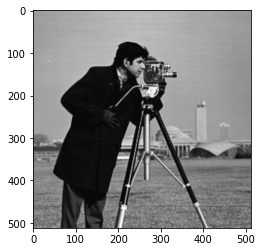

In [4]:
#p=input("enter path of cover image")
cover=cv2.imread('images/cameraman.jpg',0)
print(cover.shape)
plt.imshow(cover,cmap='gray')
plt.show()

(256, 256)


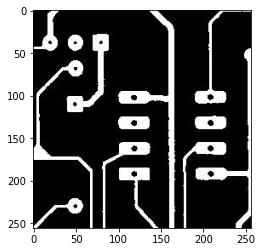

In [5]:
#msg=cv2.imread('images/GRAY_8BIT_100x100/'+input("enter path of message image"),0)
msg=cv2.imread('images/circuits.png',0)
print(msg.shape)
plt.imshow(msg,cmap='gray')
plt.show()
#4.1.05.tiff

In [6]:
hist=[0 for i in range(256)]
for i in range(msg.shape[0]):
    for j in range(msg.shape[1]):
        hist[msg[i,j]]+=1
hist_dict={i : hist[i] for i in range(256)}
hf=HuffmanCodec.from_frequencies(hist_dict)
msg_list=list(msg.flatten())
#hf.print_code_table()
print(hf._table[72])
print('len',format(hf._table[72][0],'08b'))
print('code',format(hf._table[72][1],'0'+str(hf._table[72][0])+'b'))
print(hf._table)

(190, 245199286538542217337335524344049469378998259549376348161)
len 10111110
code 0010100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001
{8: (3, 0), 16: (5, 4), 1: (256, 18092513943330655534932966407607485602073435104006338131165247501236426506240), 2: (256, 18092513943330655534932966407607485602073435104006338131165247501236426506241), 3: (255, 9046256971665327767466483203803742801036717552003169065582623750618213253121), 4: (254, 4523128485832663883733241601901871400518358776001584532791311875309106626561), 5: (253, 2261564242916331941866620800950935700259179388000792266395655937654553313281), 6: (252, 1130782121458165970933310400475467850129589694000396133197827968827276656641), 7: (251, 565391060729082985466655200237733925064794847000198066598913984413638328321), 9: (250, 282695530364541492733327600118866962532397423500099033299456992206819164161)

In [7]:

encode=hf.encode(msg_list)
print(len(encode))
print(msg_list[0])
a=format(encode[0],'08b')
print(a)
#####encoding

11968
0
11111111


In [8]:
byt_str=''
for i in range(len(encode)):
    byt_str+=format(encode[i],'08b')
print(byt_str)

0100101100110011010010110101010100110010110100101101010101010101010111111111111111111111111010010110011010011001100111111111111010101111110001111001000010000000101101010010110100101101001011001100110101010011010011010101001011010101001011010010110011010011010011011111100100111111111111111110010101111101001101111111111111111111111111111111111111111111111111111111111111111110001010101111111111111010101100011111111110010011001001010101010101010101010010110101010101001011010011010010110011010101000010101010101010101000111111111111111111111100110100110011010011011111111111010101111100011001000001000110010010001001101100001010011001101000100011000100100110010011000010011011100100110010011110001110001110001110001110001000100101101001111111111111111111111111111111111111111111111111111111111111111111110101011111111111110101011000111111111111111111111111111001001110010000101101010100011111111111111111111111111111111111101010100110101111111111110100101100111000001001111111111111111111111111111111

In [9]:
byt_list=[]
for i in range(0,len(byt_str),8):
    byt_list.append(int(byt_str[i:i+8],2))
print(bytes(byt_list))
print(type(hf.decode(bytes(byt_list))))

ai\xa6Zj\x9b\xff\xfe9\t*\xa9\xaf\xff\xff \x19R\xd3T\xd2\xd3M4\xd3KR\xd4\xd3M5\x88\xff\xff\xfdV5\x7f\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xf2I5UUUUUUKSS\xff\xff\x12qMW\xff\xff\x93\x02\x9a\x9a\x9a\xaa\xaa\xa9\xa6\xaa\xaa\xa9\xb2I\xff\xff\xf5Q$\xb5\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xc6\x15UUL\xd3SUUUU\x7f\xff\xc9\x1c\x8a\x9a\xff\xff\xfcA\xaa\xaa\xaa\xa9\xaaZjj\xaa\xaa\x98\xff\xff\xfcR\xd4u,\xaf\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xf8\xeaj\xaa\xa9\xa9f\x92je\xaa\xaa\xaa\x88\xff\xf1\x8c\xa9j\xab\xff\xff\x88\x92Z\xaa\xaae\xa6\xa7\x84\xd3KUUW\xc7\xff\xfeB\x16\xac\t\xa9\x7f\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xfc\x86j\xaa\xaa\x96\xb1\x10\xa9\x99\xaa\xaa\xbf\xff\xf1\x1a\x9ak\xff\xff\xc4ij\xaa\xa9\xa5\xa5\xc4\x95MUUS\x1f\xff\xfe:\x96\xc6\xa6\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xe2\xa6\xaa\xaa\xa9\x96"&j\xaa\xaa\xaf\xff\xfc\x99&\xaa\xbf\xff\xfc\x92B\xaa\xaa\x96\xab\xca\xc9-UUU\x7f\xff\xff\xeao\nY\x7f\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xf8\xa9j\xaa\xaaZ2e%\xa5\xa9

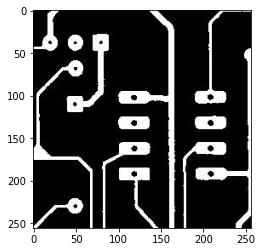

In [10]:
msg_huff_dec=np.array(hf.decode(bytes(byt_list)))
msg_huff_dec=msg_huff_dec.reshape(msg.shape[0],msg.shape[1])
plt.imshow(msg_huff_dec,cmap='gray')

original message size= 65536
compressed message length= 12233


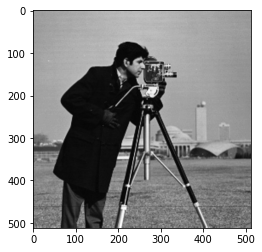

In [11]:
#########                     LSB steganography after used after huffman encoding               ########

def stego_lsb_huffman_encode(cover,msg,bits,printdetails=False):
    hist=[0 for i in range(256)]
    for i in range(msg.shape[0]):
        for j in range(msg.shape[1]):
            hist[msg[i,j]]+=1
    hist_dict={i : hist[i] for i in range(256) if hist[i]!=0}
    hf=HuffmanCodec.from_frequencies(hist_dict)
    #print(hf._table)
    msg_list=list(msg.flatten())
    encode=hf.encode(msg_list)
    cover1d=cover.flatten()
    #converting no of lsb bits to be modified
    byt_str=''
    cover1d[0]=cover1d[0] & 248
    cover1d[0]=cover1d[0] | bits
    #converting msg dimensions
    rowbits=int(math.log2(cover.shape[0])+1)
    colbits=int(math.log2(cover.shape[1])+1)
    byt_str+=format(msg.shape[0],'0'+str(rowbits)+'b')
    byt_str+=format(msg.shape[1],'0'+str(colbits)+'b')
    #print(rowbits,colbits)
    #converting table to bits
    #print(hf._table[hf._eof])
    byt_str+=format(hf._table[hf._eof][0],'08b')       #converting EOF
    byt_str+=format(hf._table[hf._eof][1],'0'+str(hf._table[hf._eof][0])+'b')
    for i in range(256):   
        if i in hf._table:                             #converting values
            byt_str+=format(hf._table[i][0],'08b')
            byt_str+=format(hf._table[i][1],'0'+str(hf._table[i][0])+'b')
        else:
            byt_str+=format(0,'08b')
    #converting huffman encoded data to bitstring
    n=len(encode)
    for i in range(n):
        byt_str+=format(encode[i],'08b')
    #print(len(byt_str)//8)
    if printdetails==True:
        print('original message size=',msg.shape[0]*msg.shape[1])
        print('compressed message length=',len(byt_str)//8)
    #embeding message into cover
    if (len(byt_str)/bits)+1>cover1d.shape[0]:
        print("message too large")
        return 
    mbt=0
    for i in range(1,cover1d.shape[0]):
        bt=format(int(cover1d[i]),'08b')
        ad=byt_str[mbt:mbt+bits]
        if ad=='':
            break
        bt=bt[:8-bits]+ad
        mbt+=bits
        cover1d[i]=int(bt,2)
    cover_stego=cover1d.reshape(cover.shape)
    return cover_stego
    
cover_stego_huff=stego_lsb_huffman_encode(cover,msg,2,True)
plt.imshow(cover_stego_huff,cmap='gray')
plt.show()

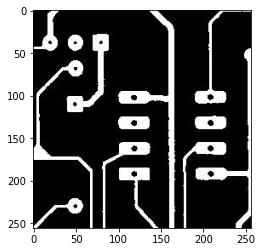

In [12]:
#########                     LSB steganography decoding after used after huffman encoding               ########
def stego_lsb_huffman_decode(stego):
    bits=int(stego[0,0] & 7)
    stego1d=stego.flatten()
    n=len(stego1d)
    byt_str=''
    for i in range(1,n):
        ad=format(int(stego1d[i]),'08b')
        byt_str+=ad[8-bits:]
    mtb=0
    rowbits=int(math.log2(stego.shape[0])+1)
    colbits=int(math.log2(stego.shape[1])+1)
    row=int(byt_str[mtb:mtb+rowbits],2)
    mtb+=rowbits
    col=int(byt_str[mtb:mtb+colbits],2)
    mtb+=colbits
    table=[]
    ln_eof=int(byt_str[mtb:mtb+8],2)
    mtb+=8
    code_eof=int(byt_str[mtb:mtb+ln_eof],2)
    mtb+=ln_eof
    for i in range(256):
        ln=int(byt_str[mtb:mtb+8],2)
        mtb+=8
        if ln!=0:
            code=int(byt_str[mtb:mtb+ln],2)
            mtb+=ln
            table.append((ln,code))
        else:
            table.append(0)
    table={i:table[i] for i in range(256) if table[i]!=0}
    htmp=HuffmanCodec.from_frequencies({0:4})
    table[htmp._eof]=(ln_eof,code_eof)
    #print(table)
    hf=HuffmanCodec(table)
    n=len(byt_str)
    data_list=[]
    while mtb<n:
        ntb=mtb+8
        if ntb<=n:
            data_list.append(int(byt_str[mtb:ntb],2))
            mtb=ntb
        else:
            data_list.append(int(byt_str[mtb:n],2))
            break
    
    msg_huff_dec=hf.decode(bytes(data_list))
    msg_huff_dec=np.array(msg_huff_dec[:row*col])
    msg_huff_dec=msg_huff_dec.reshape(row,col)
    return msg_huff_dec
    

msg_dec_huff=stego_lsb_huffman_decode(cover_stego_huff)

plt.imshow(msg_dec_huff,cmap='gray')
plt.show()

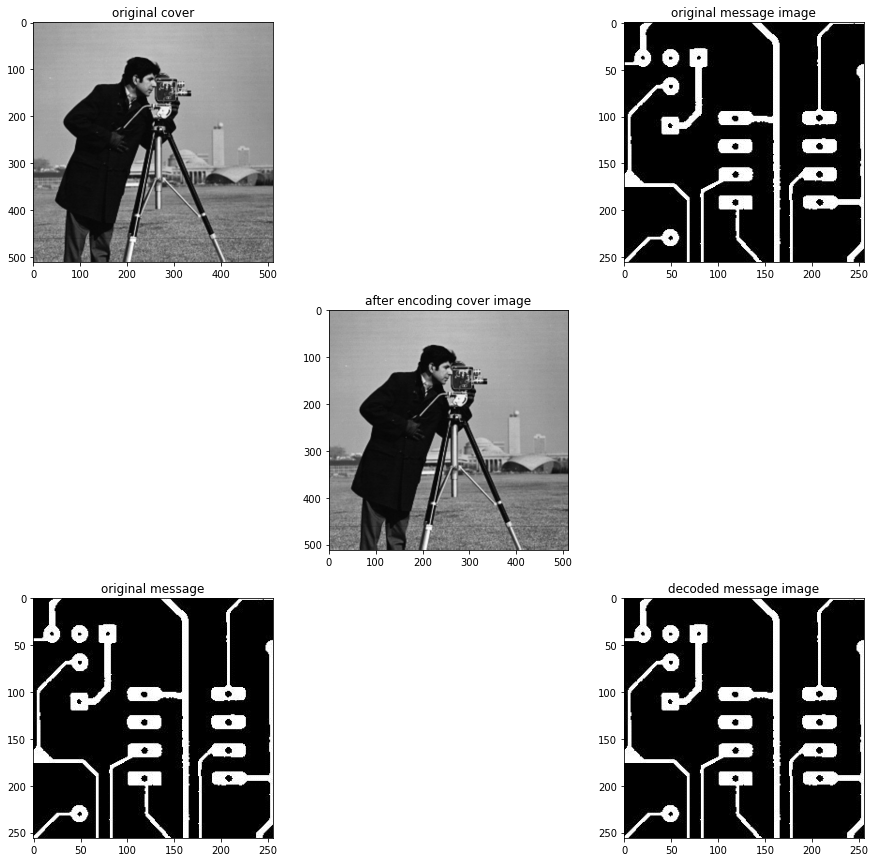

original cover image and stego image
-------------------------------------
MSE:  0.5245018005371094
PSNR:  50.93333377467049
SSIM:  0.9939431471430448

original message image and recovered message image
-----------------------------------------------------
MSE:  0.0
PSNR:  inf
SSIM:  1.0


In [13]:

plt.figure(figsize=(15,15))
plt.subplot(3,3,1)
plt.title('original cover')
plt.imshow(cover,cmap='gray')
plt.subplot(3,3,3)
plt.title('original message image')
plt.imshow(msg,cmap='gray')
plt.subplot(3,3,5)
plt.title('after encoding cover image')
plt.imshow(cover_stego_huff,cmap='gray')
plt.subplot(3,3,7)
plt.title('original message')
plt.imshow(msg,cmap='gray')
plt.subplot(3,3,9)
plt.title('decoded message image')
plt.imshow(msg_dec_huff,cmap='gray')
plt.show()
print('original cover image and stego image')
print('-------------------------------------')
print("MSE: ",metrics.mean_squared_error(cover,cover_stego_huff))
print("PSNR: ",metrics.peak_signal_noise_ratio(cover,cover_stego_huff))
print("SSIM: ",metrics.structural_similarity(cover,cover_stego_huff))
print('\noriginal message image and recovered message image')
print('-----------------------------------------------------')
print("MSE: ",metrics.mean_squared_error(msg,msg_dec_huff))
print("PSNR: ",metrics.peak_signal_noise_ratio(msg,msg_dec_huff))
print("SSIM: ",metrics.structural_similarity(msg,msg_dec_huff))

In [28]:

def stegoPerformance(msg_files,cover_files):
    mse_l=[]
    psnr_l=[]
    ssim_l=[]   
    for i in msg_files:
        mse_l.append([])
        psnr_l.append([])
        ssim_l.append([])
        for j in cover_files:
            a=cv2.imread('images/'+j,0)
            b=cv2.imread('images/'+i,0)
            x=stego_lsb_huffman_encode(a,b,2)
            y=stego_lsb_huffman_decode(x)
            print('-------------------------------------------------')
            print('COVER IMAGE:                     MESSAGE IMAGE')
            plt.subplot(1,2,1)
            plt.imshow(a,cmap='gray')
            plt.subplot(1,2,2)
            plt.imshow(b,cmap='gray')
            plt.show()
            m=metrics.mean_squared_error(a,x)
            p=metrics.peak_signal_noise_ratio(a,x)
            s=metrics.structural_similarity(a,x)
            mse_l[len(mse_l)-1].append(m)
            psnr_l[len(mse_l)-1].append(p)
            ssim_l[len(mse_l)-1].append(s)
            print("MSE: ",m)
            print("PSNR: ",p)
            print("SSIM: ",s)
            print('-----------------------------------------------------')
    return mse_l,psnr_l,ssim_l
def compPlot(msg_files,cover_files,x,xlbl='',ylbl=''):
    m=len(msg_files)
    n=len(cover_files)
    plt.figure(figsize=(10,10))
    plt.xlabel(xlbl)
    plt.ylabel(ylbl)
    sum=0
    for i in range(m):
        for j in range(n):
            sum+=x[i][j]
        plt.plot(range(0,n),x[i])
    plt.legend([x for x in msg_files],loc=1)
    plt.show()
    return sum/(m*n)

-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


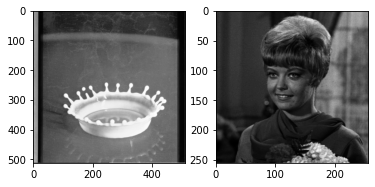

MSE:  2.2607688903808594
PSNR:  44.58824192490853
SSIM:  0.9785644582010637
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


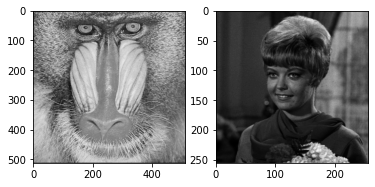

MSE:  2.261669158935547
PSNR:  44.58651285016419
SSIM:  0.994937894182963
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


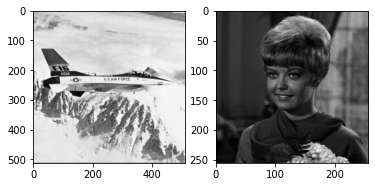

MSE:  2.2676544189453125
PSNR:  44.57503490268118
SSIM:  0.9813358273835919
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


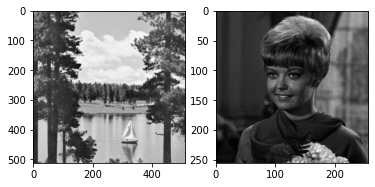

MSE:  2.2591476440429688
PSNR:  44.59135746194637
SSIM:  0.9881909746597649
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


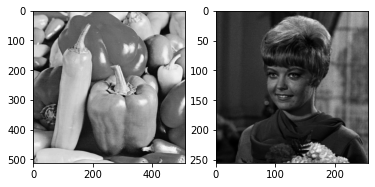

MSE:  2.237346649169922
PSNR:  44.63347083003605
SSIM:  0.9843715714767688
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


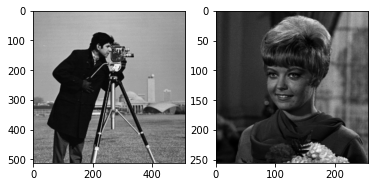

MSE:  2.256336212158203
PSNR:  44.596765473802726
SSIM:  0.9772606977848945
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


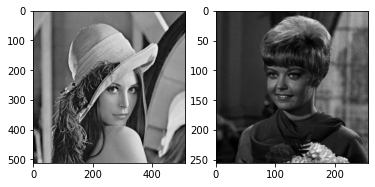

MSE:  2.246082305908203
PSNR:  44.61654694273358
SSIM:  0.9833300781433951
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


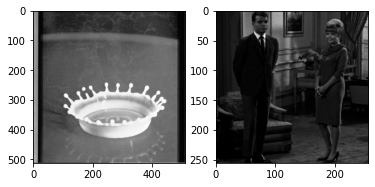

MSE:  2.080677032470703
PSNR:  44.94875687624674
SSIM:  0.9805744422946959
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


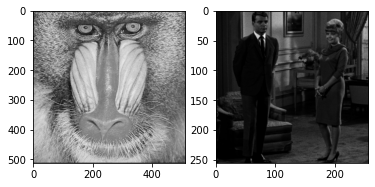

MSE:  2.0888900756835938
PSNR:  44.93164774300779
SSIM:  0.995439209628108
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


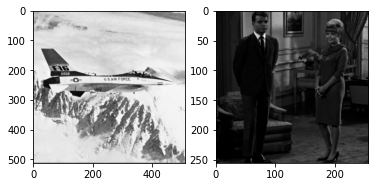

MSE:  2.062877655029297
PSNR:  44.98606889230803
SSIM:  0.9829859507878279
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


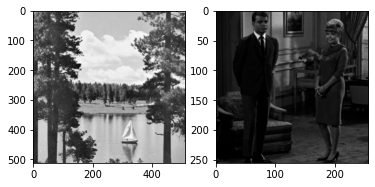

MSE:  2.100818634033203
PSNR:  44.906917999605184
SSIM:  0.9892188937512618
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


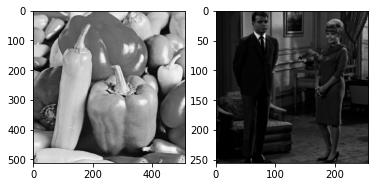

MSE:  2.0718231201171875
PSNR:  44.96727685680864
SSIM:  0.9856269824158188
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


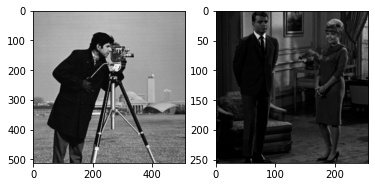

MSE:  2.0778579711914062
PSNR:  44.95464502168357
SSIM:  0.9781252047076598
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


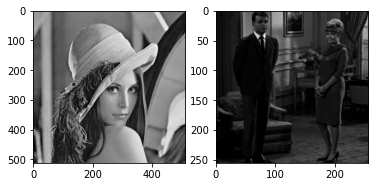

MSE:  2.0571022033691406
PSNR:  44.99824491508333
SSIM:  0.9847144375558343
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


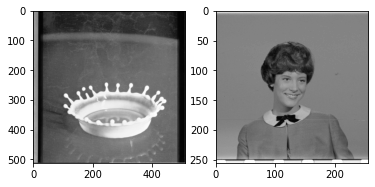

MSE:  1.7892189025878906
PSNR:  45.60416883145599
SSIM:  0.9833901205761871
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


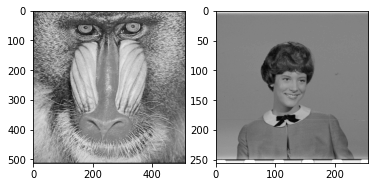

MSE:  1.7925071716308594
PSNR:  45.5961945895849
SSIM:  0.9962966514445907
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


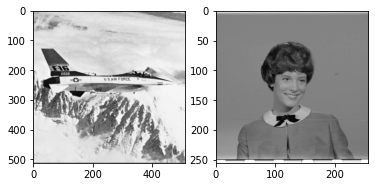

MSE:  1.7791557312011719
PSNR:  45.628663969092
SSIM:  0.9849296135431073
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


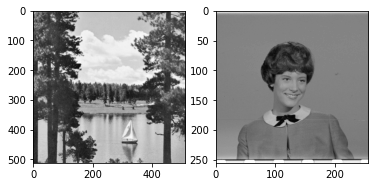

MSE:  1.7900352478027344
PSNR:  45.602187780581225
SSIM:  0.9909390883023963
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


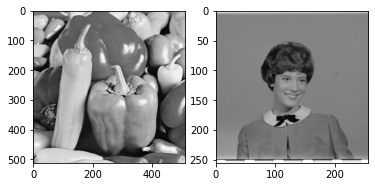

MSE:  1.7894783020019531
PSNR:  45.60353924069772
SSIM:  0.9876992334885786
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


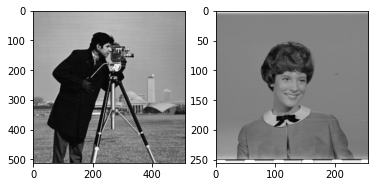

MSE:  1.7893218994140625
PSNR:  45.60391883596483
SSIM:  0.9803658233619885
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


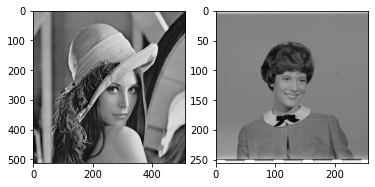

MSE:  1.7893524169921875
PSNR:  45.60384476599026
SSIM:  0.986467666088545
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


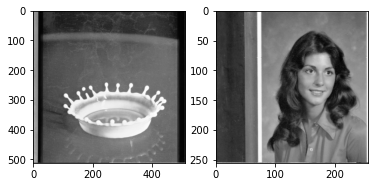

MSE:  2.3070831298828125
PSNR:  44.50017117365914
SSIM:  0.9779629662658573
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


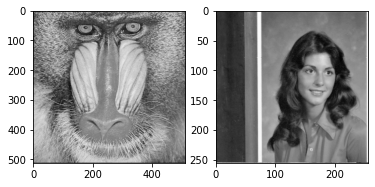

MSE:  2.310260772705078
PSNR:  44.49419356839451
SSIM:  0.994821782349493
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


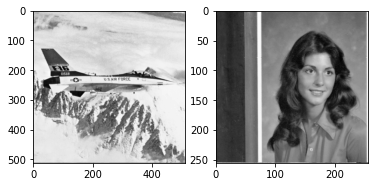

MSE:  2.3427352905273438
PSNR:  44.43357141139023
SSIM:  0.9807929984037534
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


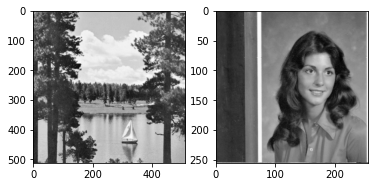

MSE:  2.3265342712402344
PSNR:  44.46370906534237
SSIM:  0.9877441153951658
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


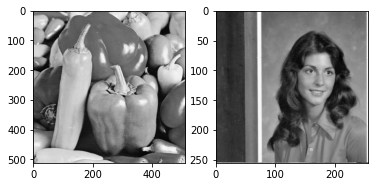

MSE:  2.32781982421875
PSNR:  44.461309984535404
SSIM:  0.9840201287761243
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


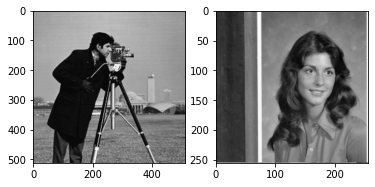

MSE:  2.2985610961914062
PSNR:  44.51624308998178
SSIM:  0.9772681158755869
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


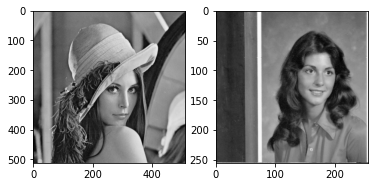

MSE:  2.29974365234375
PSNR:  44.514009320578005
SSIM:  0.9830670767790303
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


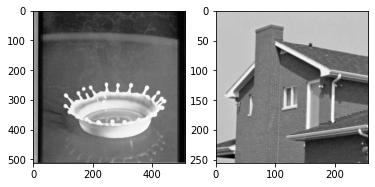

MSE:  2.0976715087890625
PSNR:  44.91342881343054
SSIM:  0.9806318618147997
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


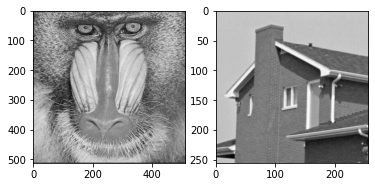

MSE:  2.0616836547851562
PSNR:  44.988583330537736
SSIM:  0.9953407584556039
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


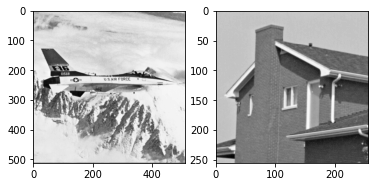

MSE:  2.032115936279297
PSNR:  45.05131879180229
SSIM:  0.9832131116484409
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


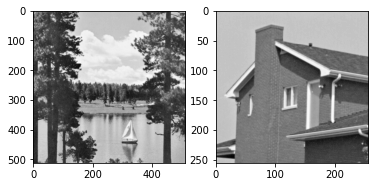

MSE:  2.070575714111328
PSNR:  44.969892450251436
SSIM:  0.9893285448624691
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


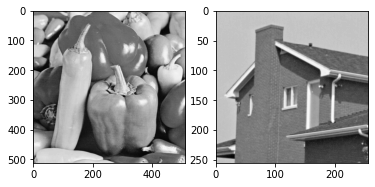

MSE:  2.0584335327148438
PSNR:  44.995435127752195
SSIM:  0.9856584368429409
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


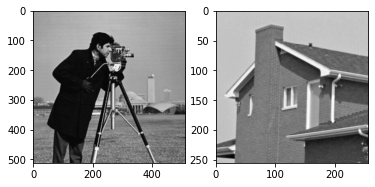

MSE:  2.0701141357421875
PSNR:  44.97086069924754
SSIM:  0.9782140703457634
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


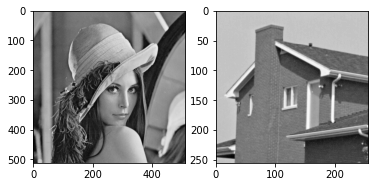

MSE:  2.0623931884765625
PSNR:  44.987088952126975
SSIM:  0.9846904611380348
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


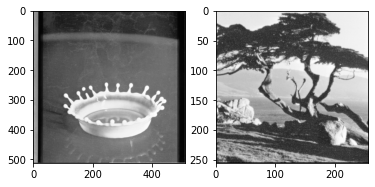

MSE:  2.329204559326172
PSNR:  44.458727293167506
SSIM:  0.9777827916268412
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


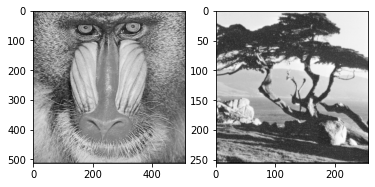

MSE:  2.3223228454589844
PSNR:  44.47157766371896
SSIM:  0.9948058391746105
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


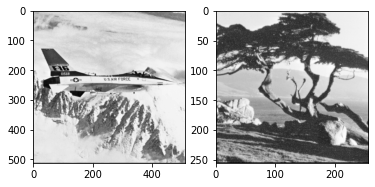

MSE:  2.3072891235351562
PSNR:  44.499783420345516
SSIM:  0.9808820780164634
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


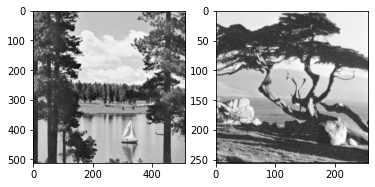

MSE:  2.3198471069335938
PSNR:  44.476209978749125
SSIM:  0.9876614209043686
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


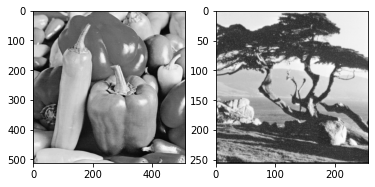

MSE:  2.3276634216308594
PSNR:  44.46160179003578
SSIM:  0.9839167507697437
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


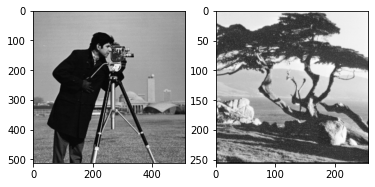

MSE:  2.329425811767578
PSNR:  44.45831477400702
SSIM:  0.9770827717853795
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


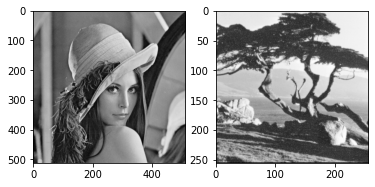

MSE:  2.3164939880371094
PSNR:  44.48249183445377
SSIM:  0.9828857681050089
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


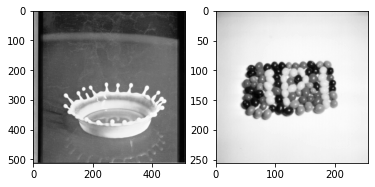

MSE:  1.8591880798339844
PSNR:  45.437570346235304
SSIM:  0.9829479815117894
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


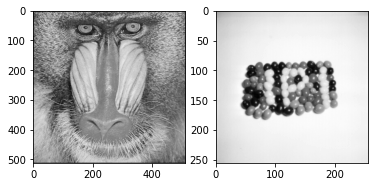

MSE:  1.8422622680664062
PSNR:  45.477289035923086
SSIM:  0.9961357936333282
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


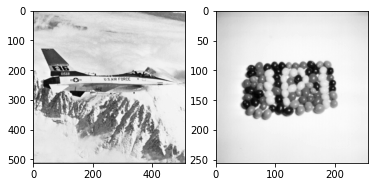

MSE:  1.8319587707519531
PSNR:  45.50164665464248
SSIM:  0.9846368794489052
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


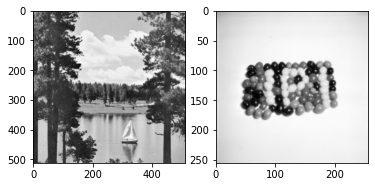

MSE:  1.8518524169921875
PSNR:  45.45473988154741
SSIM:  0.9906524833009386
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


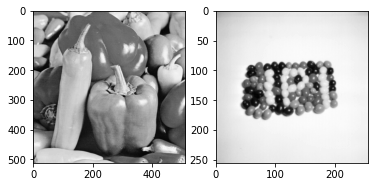

MSE:  1.8420867919921875
PSNR:  45.47770272251768
SSIM:  0.9873643587728983
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


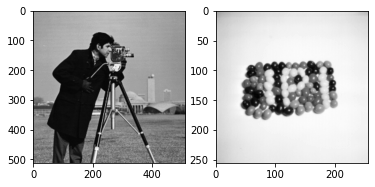

MSE:  1.8579826354980469
PSNR:  45.44038710059921
SSIM:  0.9798008994261173
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


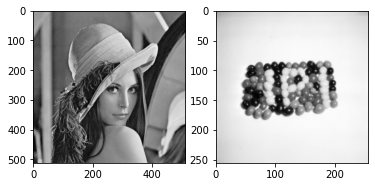

MSE:  1.8527336120605469
PSNR:  45.45267380366511
SSIM:  0.9859939098980458
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


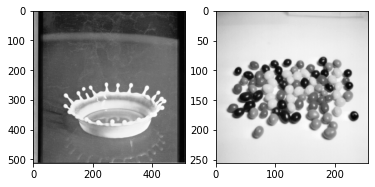

MSE:  1.99847412109375
PSNR:  45.12381832059103
SSIM:  0.981470759631546
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


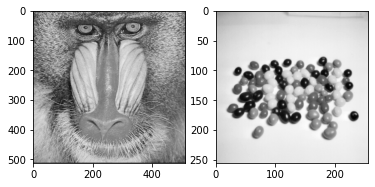

MSE:  2.012554168701172
PSNR:  45.09332782460842
SSIM:  0.9956698330299582
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


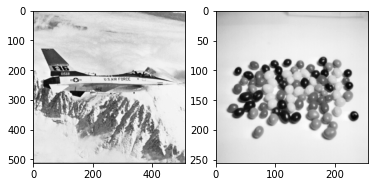

MSE:  2.017547607421875
PSNR:  45.082565694457095
SSIM:  0.9836150061205514
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


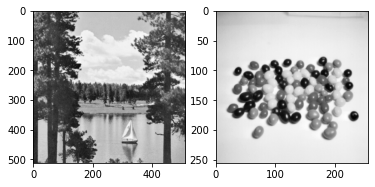

MSE:  1.9859695434570312
PSNR:  45.151077769351204
SSIM:  0.989767322478195
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


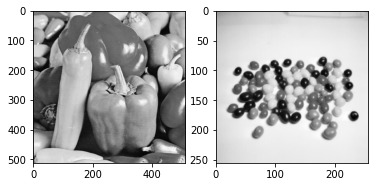

MSE:  1.9843330383300781
PSNR:  45.15465797600726
SSIM:  0.9862628167834384
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


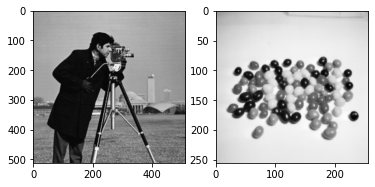

MSE:  2.0003433227539062
PSNR:  45.119758200132445
SSIM:  0.9786692338995825
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


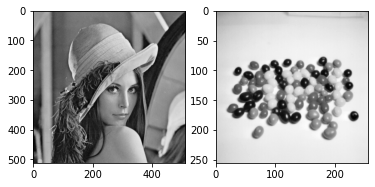

MSE:  1.9882659912109375
PSNR:  45.14605876788639
SSIM:  0.9851927312145616
-----------------------------------------------------


In [30]:
msg_files=['4.1.01.tiff','4.1.02.tiff','4.1.03.tiff','4.1.04.tiff','4.1.05.tiff','4.1.06.tiff','4.1.07.tiff','4.1.08.tiff']
cover_files=['4.2.01.tiff','4.2.03.tiff','4.2.05.tiff','4.2.06.tiff','4.2.07.tiff','cameraman.jpg','Lenna.png']
mse_l,psnr_l,ssim_l=stegoPerformance(msg_files,cover_files)


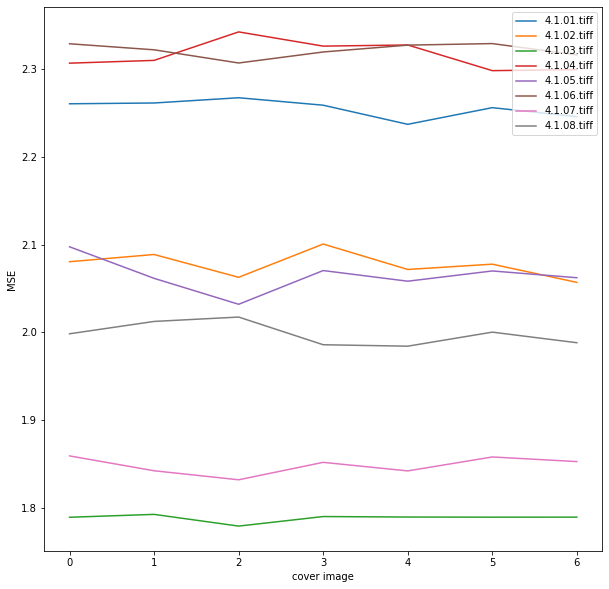

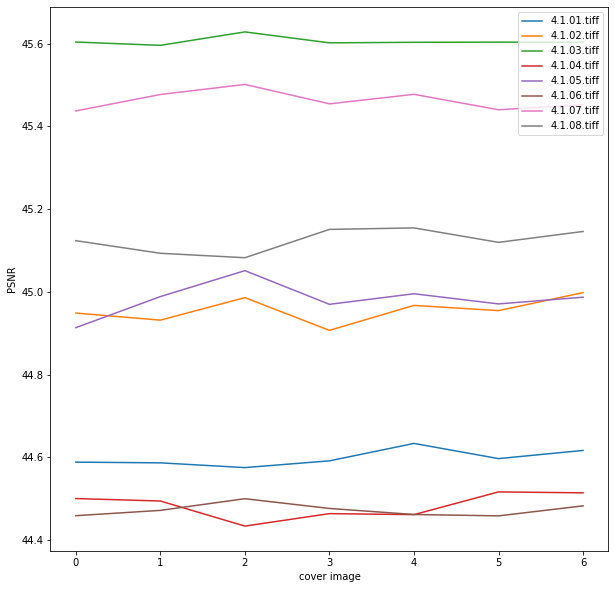

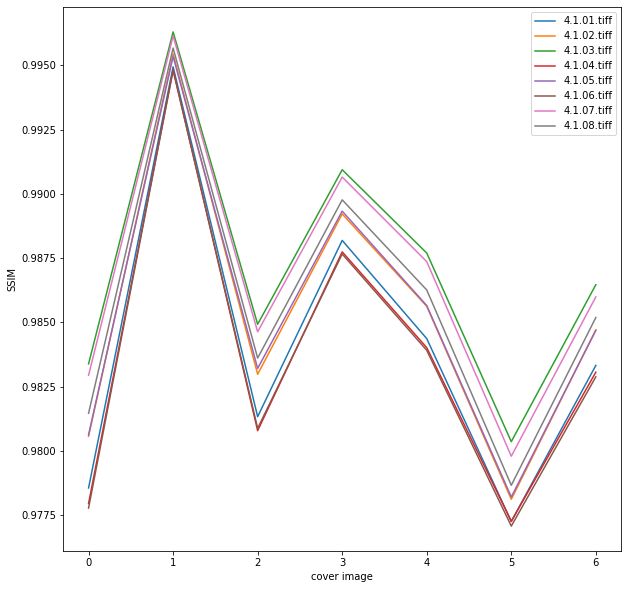

average MSE = 2.0837794031415666
average PSNR= 44.96081791671526
average SSIM= 0.9851913692547212


In [31]:
av_mse=compPlot(msg_files,cover_files,mse_l,'cover image','MSE')
av_psnr=compPlot(msg_files,cover_files,psnr_l,'cover image','PSNR')
av_ssim=compPlot(msg_files,cover_files,ssim_l,'cover image','SSIM')
print('average MSE =',av_mse)
print('average PSNR=',av_psnr)
print('average SSIM=',av_ssim)

-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


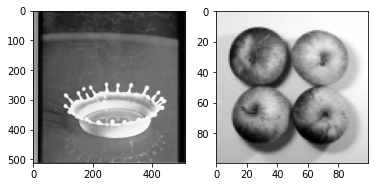

MSE:  0.38581085205078125
PSNR:  52.2670592159455
SSIM:  0.9968918350311571
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


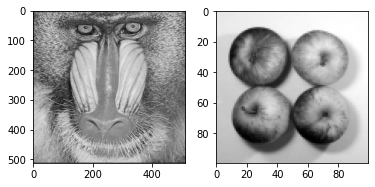

MSE:  0.3860893249511719
PSNR:  52.26392566959199
SSIM:  0.9997003178391689
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


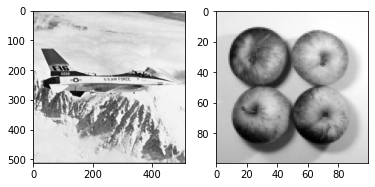

MSE:  0.3865089416503906
PSNR:  52.25920815357411
SSIM:  0.9962853260090351
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


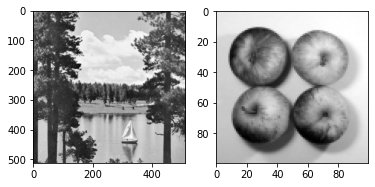

MSE:  0.3909645080566406
PSNR:  52.20943027141544
SSIM:  0.9976157661643518
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


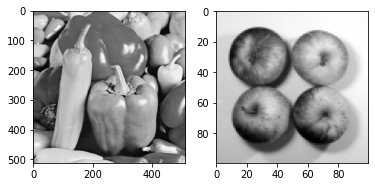

MSE:  0.3856544494628906
PSNR:  52.26882014496391
SSIM:  0.9972757742293525
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


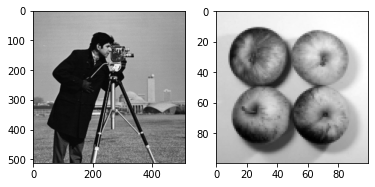

MSE:  0.38719940185546875
PSNR:  52.25145683127913
SSIM:  0.994769713452254
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


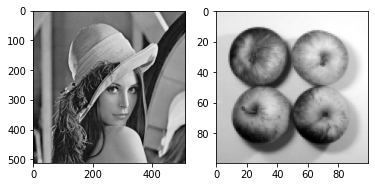

MSE:  0.38857269287109375
PSNR:  52.23608083780938
SSIM:  0.9960642931290627
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


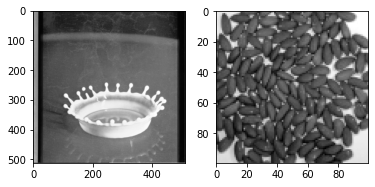

MSE:  0.38878631591796875
PSNR:  52.23369390174119
SSIM:  0.9969253189854796
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


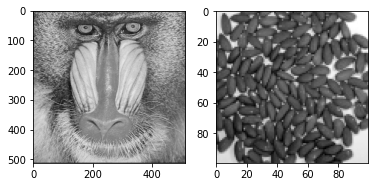

MSE:  0.3809165954589844
PSNR:  52.32250466812219
SSIM:  0.9997113446718174
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


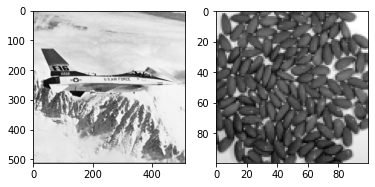

MSE:  0.40628814697265625
PSNR:  52.04246208439254
SSIM:  0.9964228105524388
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


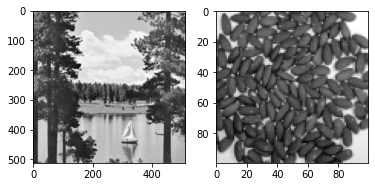

MSE:  0.3745689392089844
PSNR:  52.395485998132884
SSIM:  0.99775799133535
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


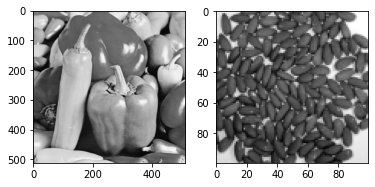

MSE:  0.38938140869140625
PSNR:  52.22705148905989
SSIM:  0.9973409142719966
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


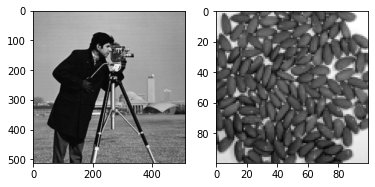

MSE:  0.3918342590332031
PSNR:  52.199779561141845
SSIM:  0.9948796156125707
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


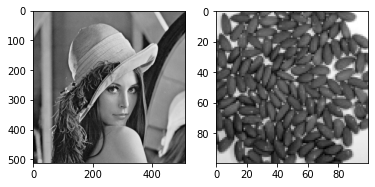

MSE:  0.3929290771484375
PSNR:  52.1876619263676
SSIM:  0.9961658824074415
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


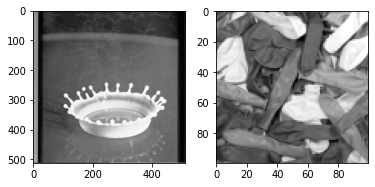

MSE:  0.3845329284667969
PSNR:  52.28146825471395
SSIM:  0.9968871416161632
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


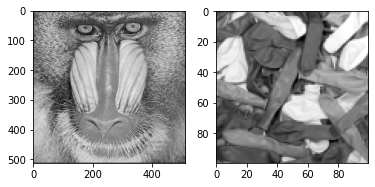

MSE:  0.3873329162597656
PSNR:  52.249959551740005
SSIM:  0.9996993173061829
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


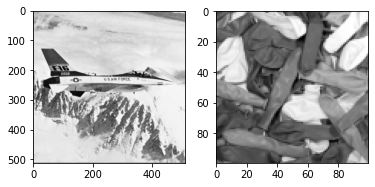

MSE:  0.3857154846191406
PSNR:  52.26813286819967
SSIM:  0.9962726680057858
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


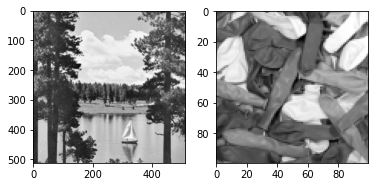

MSE:  0.38739776611328125
PSNR:  52.24923248789083
SSIM:  0.9976057294448726
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


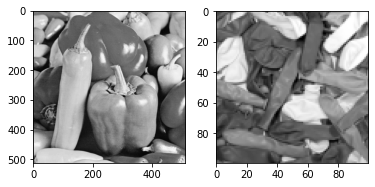

MSE:  0.38692474365234375
PSNR:  52.25453857334141
SSIM:  0.9972378694504254
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


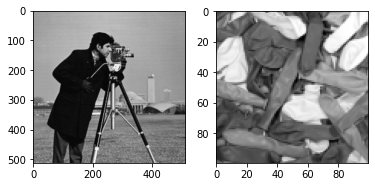

MSE:  0.386627197265625
PSNR:  52.25787959683058
SSIM:  0.9947467758961713
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


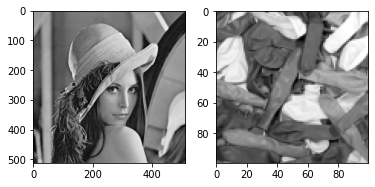

MSE:  0.3912162780761719
PSNR:  52.206634438638524
SSIM:  0.9960307125281336
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


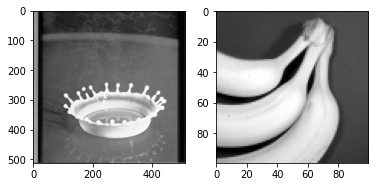

MSE:  0.3620719909667969
PSNR:  52.54285430745864
SSIM:  0.9970253420131046
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


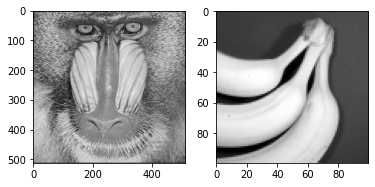

MSE:  0.3698577880859375
PSNR:  52.45045592805957
SSIM:  0.9997173013118046
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


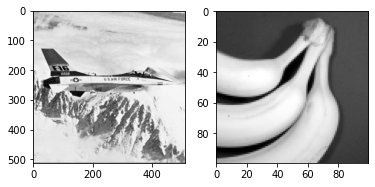

MSE:  0.403564453125
PSNR:  52.07167455264237
SSIM:  0.9964183433965588
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


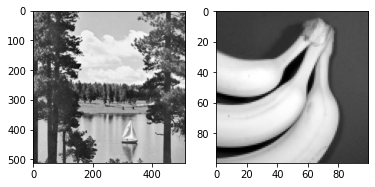

MSE:  0.4007225036621094
PSNR:  52.1023662876251
SSIM:  0.9977012756031867
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


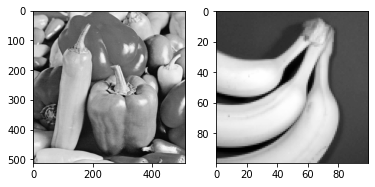

MSE:  0.3783912658691406
PSNR:  52.35139257526669
SSIM:  0.9973846916922656
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


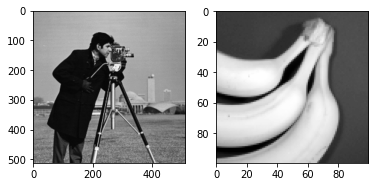

MSE:  0.38616943359375
PSNR:  52.26302465704499
SSIM:  0.9949449281572338
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


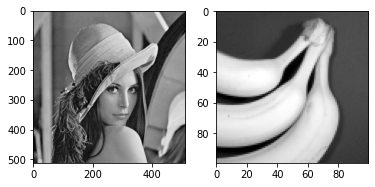

MSE:  0.3661651611328125
PSNR:  52.49403339983449
SSIM:  0.99624946040928
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


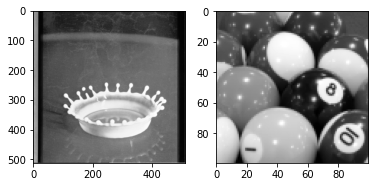

MSE:  0.4021453857421875
PSNR:  52.08697270940633
SSIM:  0.9967725422943245
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


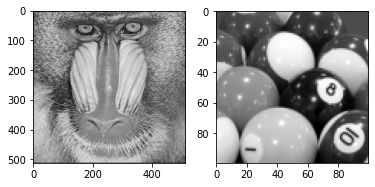

MSE:  0.4002189636230469
PSNR:  52.10782697852765
SSIM:  0.9996951086762217
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


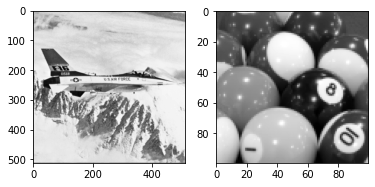

MSE:  0.4004173278808594
PSNR:  52.10567497754414
SSIM:  0.9960971817165296
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


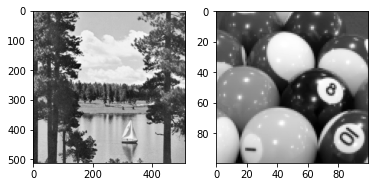

MSE:  0.39763641357421875
PSNR:  52.13594212782891
SSIM:  0.9975453620992066
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


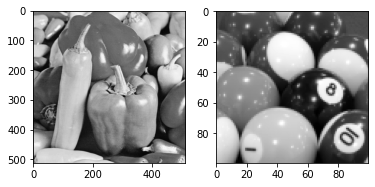

MSE:  0.3983345031738281
PSNR:  52.128324348527244
SSIM:  0.9971520232534975
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


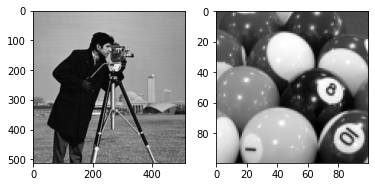

MSE:  0.3993186950683594
PSNR:  52.11760717653375
SSIM:  0.9945808770734058
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


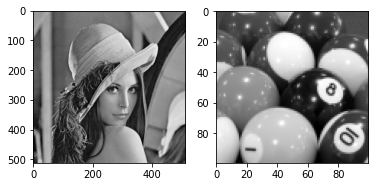

MSE:  0.4006919860839844
PSNR:  52.10269704320681
SSIM:  0.9959711165382121
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


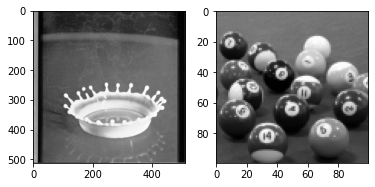

MSE:  0.3758125305175781
PSNR:  52.38109104411773
SSIM:  0.9969627352963241
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


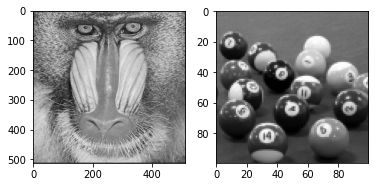

MSE:  0.3777351379394531
PSNR:  52.35892974919351
SSIM:  0.9997112202207131
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


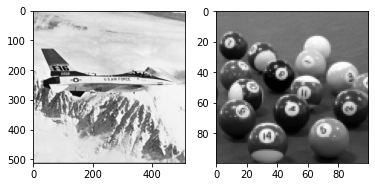

MSE:  0.3775634765625
PSNR:  52.36090384496487
SSIM:  0.9963715337532818
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


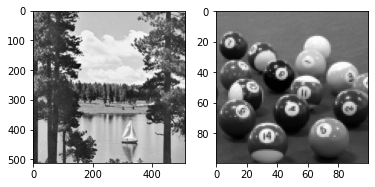

MSE:  0.376953125
PSNR:  52.367930128359674
SSIM:  0.9976909564225018
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


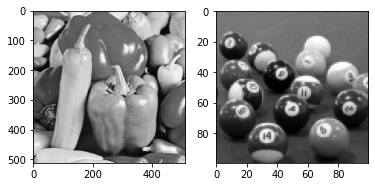

MSE:  0.3788604736328125
PSNR:  52.3460106300541
SSIM:  0.9973120870313049
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


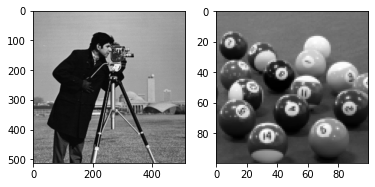

MSE:  0.3760185241699219
PSNR:  52.37871120337556
SSIM:  0.9948728584495174
-----------------------------------------------------
-------------------------------------------------
COVER IMAGE:                     MESSAGE IMAGE


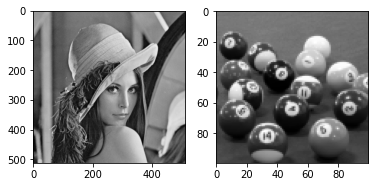

MSE:  0.37909698486328125
PSNR:  52.343300305761275
SSIM:  0.9961221820895796
-----------------------------------------------------


In [32]:
msg_files=['GRAY_8BIT_100x100/'+str(x)+'.png' for x in range(2,8)]
cover_files=['4.2.01.tiff','4.2.03.tiff','4.2.05.tiff','4.2.06.tiff','4.2.07.tiff','cameraman.jpg','Lenna.png']
mse_l,psnr_l,ssim_l=stegoPerformance(msg_files,cover_files)


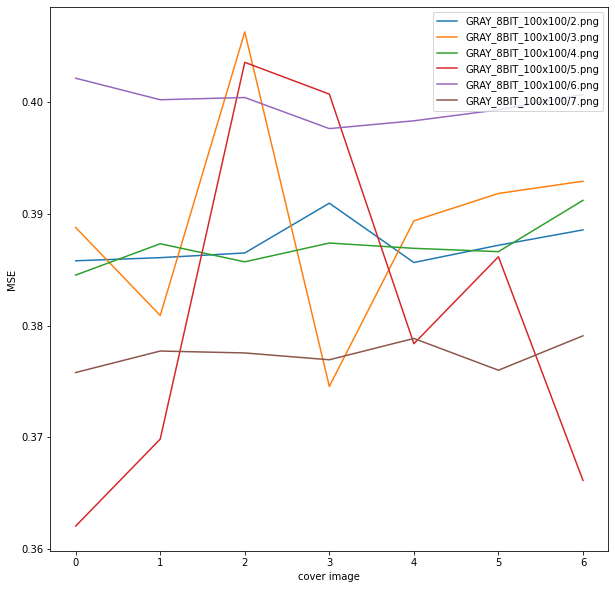

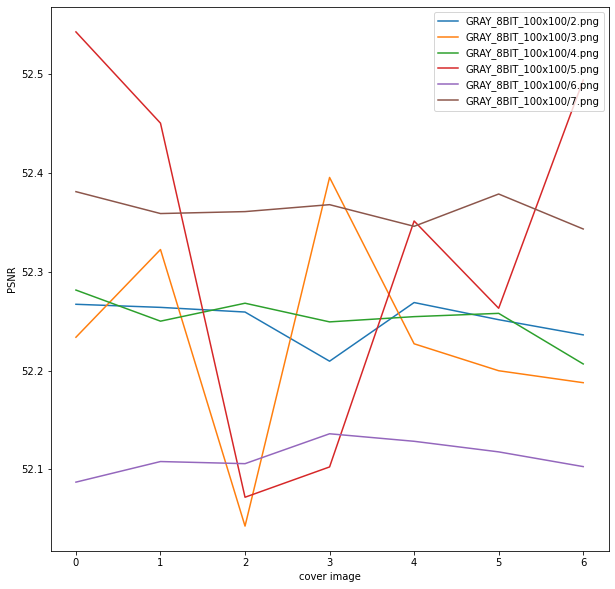

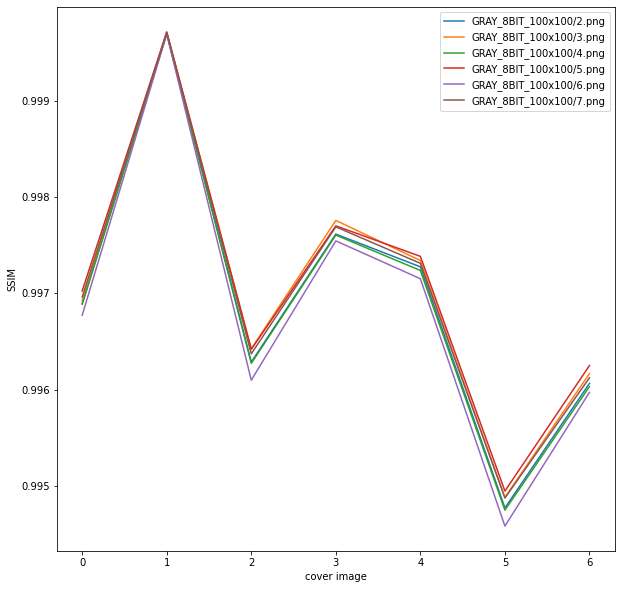

average MSE = 0.3869761512393043
average PSNR= 52.255480726195856
average SSIM= 0.9969663391770774


In [33]:
av_mse=compPlot(msg_files,cover_files,mse_l,'cover image','MSE')
av_psnr=compPlot(msg_files,cover_files,psnr_l,'cover image','PSNR')
av_ssim=compPlot(msg_files,cover_files,ssim_l,'cover image','SSIM')
print('average MSE =',av_mse)
print('average PSNR=',av_psnr)
print('average SSIM=',av_ssim)